# VISUALIZING DYAD

In [1]:
import skimage 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

>Load the image into memory and compute its SVD:

In [2]:
X = skimage.data.gravel()
m, n = X.shape
print(f'Image shape: {X.shape}')

Image shape: (512, 512)


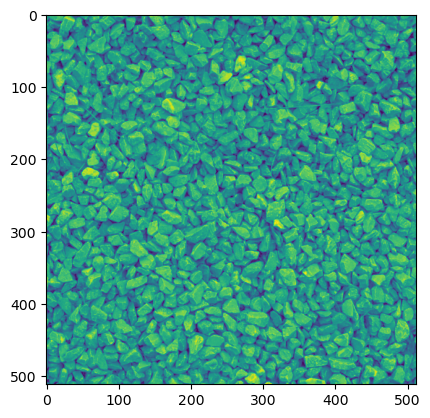

In [3]:
plt.imshow(X)
plt.grid(False)
plt.show()

In [4]:
U, s, VT = np.linalg.svd(X)
print(f'U shape: {U.shape}')
print(f's shape: {s.shape}')
print(f'VT shape: {VT.shape}')

U shape: (512, 512)
s shape: (512,)
VT shape: (512, 512)


>Visualize "some of" the dyad σi * ui @ viT of this decomposition:

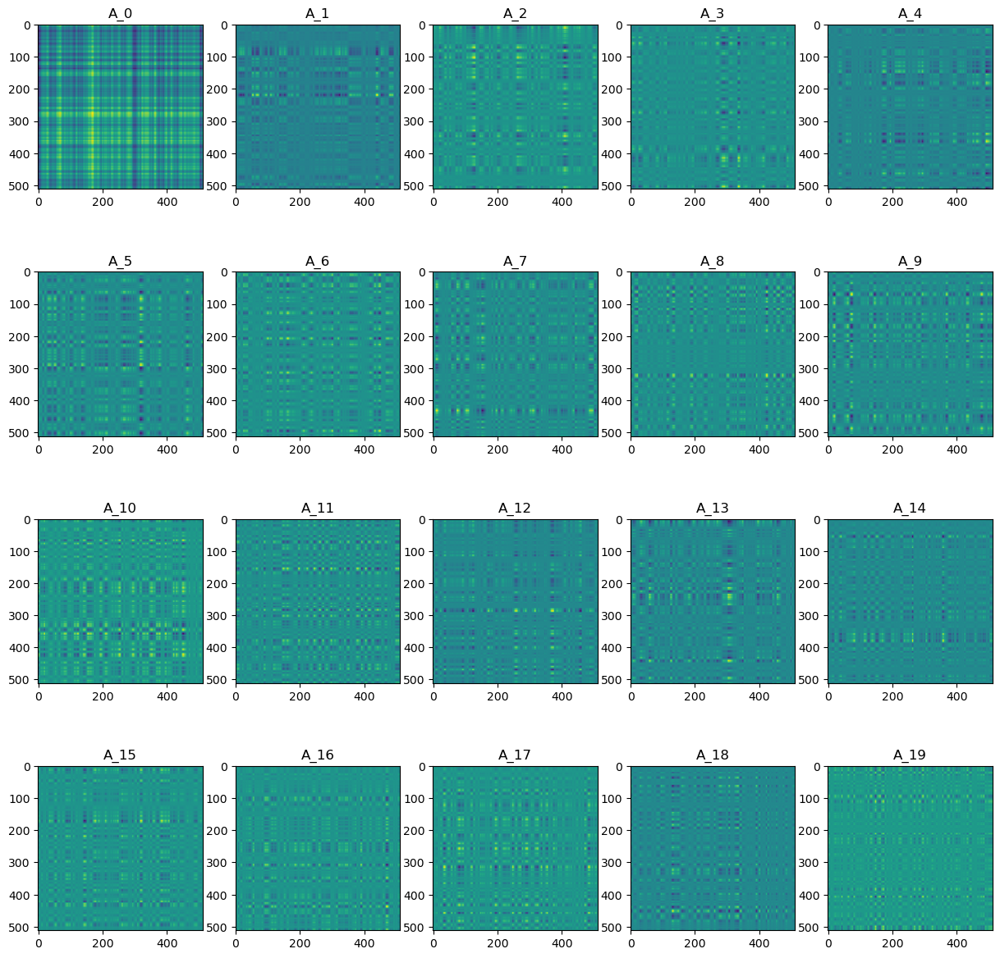

In [5]:
k = 20
plt.figure(figsize=(15,15))
for i in range(k):
    A_i = s[i] * U[:, i:i+1] @ VT[i:i+1, :]
    plt.subplot(k//5, 5, i+1)
    plt.imshow(A_i)
    plt.title(str(f'A_{i}'))
    plt.grid(False)
    
plt.show()

<div class="alert alert-block alert-info">
<b>Observation:</b> We notice that with increasing order of dyad the details/features of the image are smaller. This means that, even with only a little amount of dyads, we can approximate the original image with "high" accuracy. <br>
If we try to show dyads for, let's say, k=80, we notice a kind of stationariety of the image.. 
</div>

>Plot the singular values of X. Do you note something?

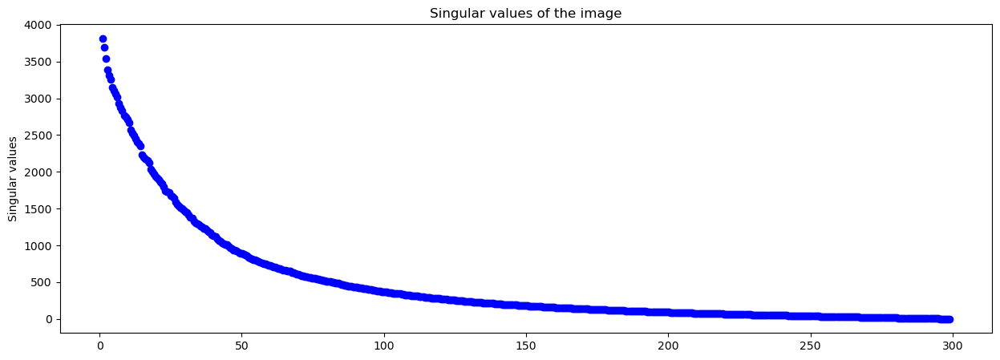

In [22]:
domain_scale = np.linspace(1, 299, s.shape[0]-1)
plt.figure(figsize=(15,5))
#for scaling purposes we avoid to plot the first singular value
plt.plot(domain_scale, s[1:], 'bo')
plt.title('Singular values of the image')
plt.ylabel('Singular values')
plt.show()

<div class="alert alert-block alert-info">
<b>Observation:</b> The singular values follows an exponential distribution.  <br>
A lot of them are near (equal) to zero, this may mean that the image can be approximated with a very low rank matrix..  
</div>

<div class="alert alert-block alert-success">
Let's count the number of "zero" singular values:
</div>

In [23]:
number_of_non_zero_singular_values = np.sum(s > 0)
print(f'{number_of_non_zero_singular_values} non-zero singular values out of {s.shape[0]}')

512 non-zero singular values out of 512


<div class="alert alert-block alert-success">
We can truncate the plot in order to focus only on the non-zero singular values:
</div>

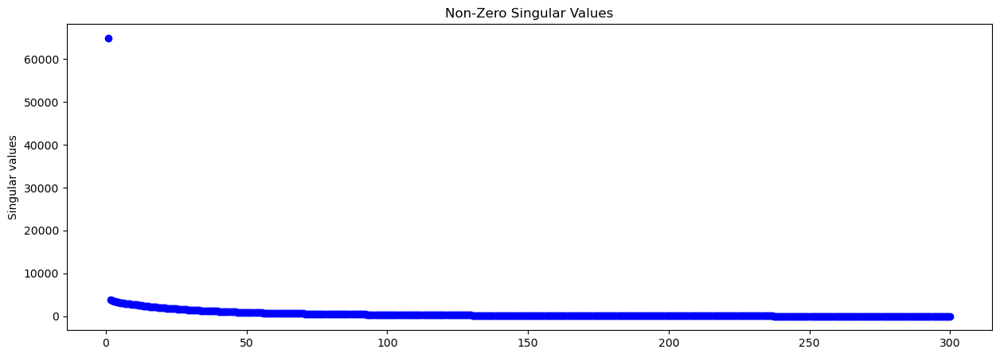

In [25]:
nzs = s[s > 1e-10]
ls = np.linspace(1,300,nzs.shape[0])
plt.figure(figsize=(15,5))
plt.plot(ls, nzs, 'bo')
plt.title('Non-Zero Singular Values')
plt.ylabel('Singular values')
plt.show()

<div class="alert alert-block alert-info">
<b>Observation:</b> The shape of the line is the same.
</div>

>Visualize the k-rank approximation of X for different values of k. 

In [26]:
def k_rank_approx(A,k):
    A_k = np.zeros( (m,n), dtype=np.float64 )
    for i in range(k):
        A_k=np.add(A_k,s[i]*(U[:,i:i+1] @ VT[i:i+1,:]))
    return A_k, np.linalg.norm(A - A_k, 2)

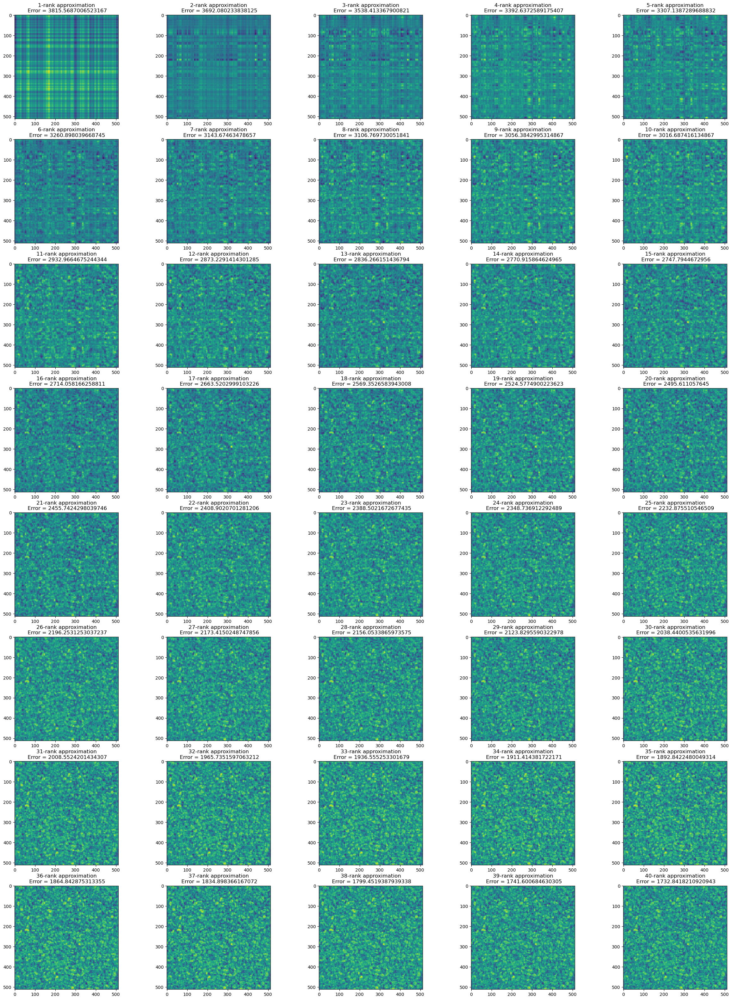

In [33]:
k = 41
plt.figure(figsize=(30,40))
for i in range(1, k):
    plt.subplot(k//5, 5, i)
    im, err = k_rank_approx(X,i)
    plt.imshow(im)
    plt.title(str(f'{i}-rank approximation\n Error = {err}'))
    plt.grid(False)
plt.show()

<div class="alert alert-block alert-info">
<b>Observation:</b> The approximation error ||X - X(k)|| has a "small" decrease from certain k on.  
</div>

>In order to study the "stationariety" of the approximation error we can plot it for increasing values of k. 

In [34]:
def approx_error(A,k):
    errors = []
    A_k = np.zeros( (m,n), dtype=np.float64 )
    for i in range(k):
        A_k=np.add(A_k,s[i]*(U[:,i:i+1] @ VT[i:i+1,:]))
        errors.append(np.linalg.norm(A - A_k, 2))
    return np.array(errors)

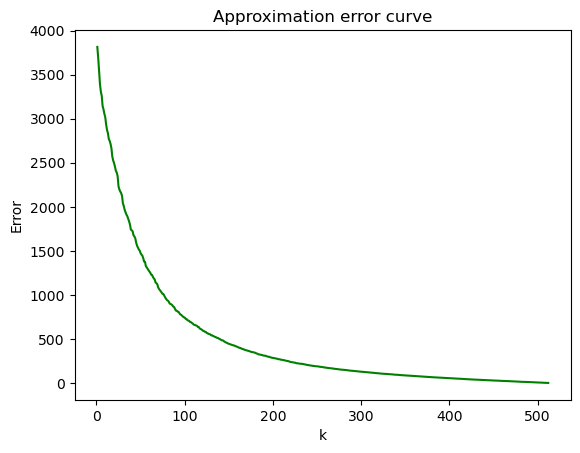

In [35]:
k = X.shape[0]
errs = approx_error(X, k)
ls = np.linspace(1, k, k)
plt.plot(ls, errs, 'g')
plt.title('Approximation error curve')
plt.xlabel('k')
plt.ylabel('Error')
plt.show()

<div class="alert alert-block alert-info">
<b>Observation:</b> As we expect. We previously plotted the singular values, and we know that the k-th approximation error is equal to the (k+1)-th singular value (in fact the coordinates of the first singular value is not in the plot), so the plot must be the same for increasing values of k.
</div>

>Plot the compression factor ck = k(m+n+1)/mn for increasing k:

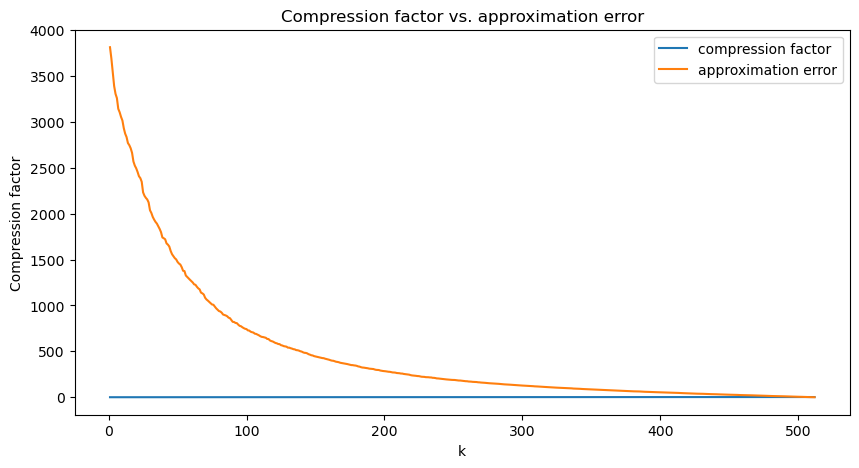

In [36]:
compression_factors = []
k = X.shape[0]

ls = np.linspace(1, k, k)
constsant_factor = (m+n+1)/(m*n)
for i in range(1, k+1):
    compression_factors.append(i*constsant_factor)

plt.figure(figsize=(10,5))
plt.plot(ls, compression_factors)
plt.plot(ls, errs)
plt.legend(['compression factor', 'approximation error'])
plt.title("Compression factor vs. approximation error")
plt.xlabel('k')
plt.ylabel('Compression factor')
plt.show()

>What is the approximation error when the compressed image requires the same amount of informations of those of the uncompressed image (i.e. ck = 1)?    
Whe can simply find k when ck=1 and compute the k-rank approximation, focusing on the 'bottom' side of the plot in order to zoom in: 

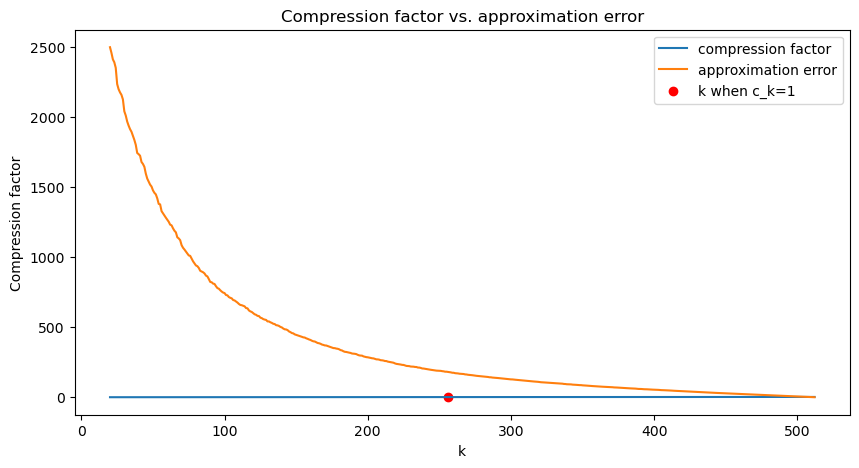

k=256, where the maximum k feasible is 512


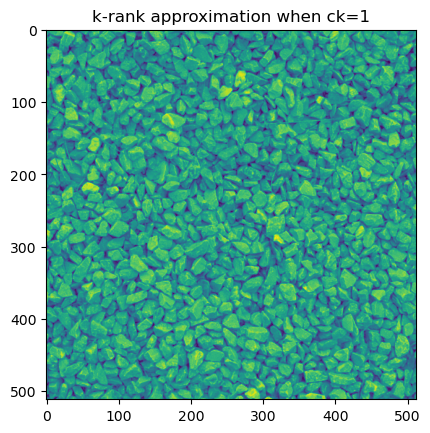

In [37]:
compression_factors = []
k = X.shape[0]
start = 20

ls = np.linspace(start, number_of_non_zero_singular_values, number_of_non_zero_singular_values-start+1)
constsant_factor = (m+n+1)/(m*n)
for i in range(start, number_of_non_zero_singular_values+1):
    compression_factors.append(i*constsant_factor)

k_for_c_k_equals_1 = round((m*n)/(m+n+1))

plt.figure(figsize=(10,5))
plt.plot(ls, compression_factors)
plt.plot(ls, errs[start-1:number_of_non_zero_singular_values])
plt.scatter([k_for_c_k_equals_1], [1], color='red')
plt.legend(['compression factor', 'approximation error', 'k when c_k=1'])
plt.title("Compression factor vs. approximation error")
plt.xlabel('k')
plt.ylabel('Compression factor')
plt.show()

print(f'k={k_for_c_k_equals_1}, where the maximum k feasible is {s.shape[0]}')
im, _ = k_rank_approx(X, k_for_c_k_equals_1)
plt.imshow(im)
plt.title('k-rank approximation when ck=1')
plt.grid(False)
plt.show()

<div class="alert alert-block alert-info">
<b>Observation:</b> We cut the graph from the first zero-valued singular value on because they don't add new informations. <br>
We see that the approximation error is very low, and we obtain a very good approximation with a matrix with a rank of an half of the original one. <br>
Looking at the two curves, we observe that the red point is relatively close to the trade-off value between the approximation error and the compression factor.
</div>

# Classification of MNIST Digits with SVD Decomposition

>Load the MNIST dataset and extract X and the corresponding labels.

In [38]:
import scipy as sp

url = '/Users/kor/University/Unibo/I year/I semester/statistical and mathematical methods for AI/Lab/hm2/MNIST.mat'

In [39]:
ds = sp.io.loadmat(url)
X = ds['X']
Y = ds['I']

print(X.shape)
print(Y.shape)

(256, 1707)
(1, 1707)


>Visualize a bunch of datapoints of X

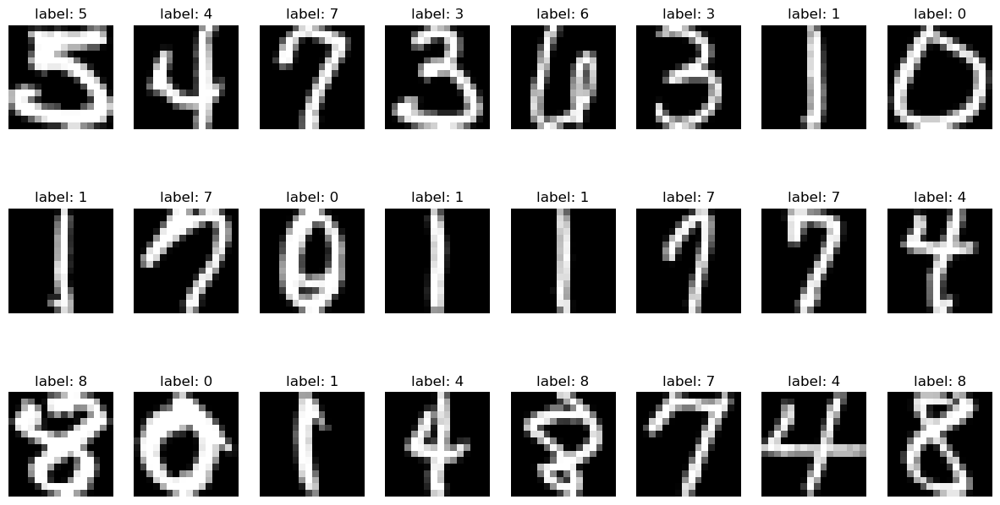

In [40]:
n_imgs = 24
grid_rows = 3
grid_cols = 8

plt.figure(figsize=(15,8))
for i in range(1, n_imgs+1):
    plt.subplot(grid_rows, grid_cols, i)
    plt.title(str(f'label: {Y[0, i]}'))
    plt.imshow( np.reshape(X[:, i], (16,16)), cmap='gray' )
    plt.axis('off')

plt.show()

>Extract from X those columns that corresponds to digits 3 or 4.  
Those digits represents the classes C1 and C2:

In [3]:
def extract_digits(X, Y, digits):
    idxs = np.isin(Y[0,:], digits)
    return X[:, idxs], Y[:, idxs]

In [42]:
C1 = 3
C2 = 4
classes = [C1,C2]

In [43]:
X_dig, Y_dig = extract_digits(X, Y, classes)
print(f'New dataset shape: {X_dig.shape}')

New dataset shape: (256, 253)


>Split the obtained dataset in training and testing

In [4]:
def train_test_split(X, Y, N_train):
    idxs = np.arange(0, Y.shape[1])
    np.random.shuffle(idxs)

    train_idxs = idxs[:N_train]
    test_idxs = idxs[N_train:]

    X_train = X[:, train_idxs]
    Y_train = Y[:, train_idxs]

    X_test = X[:, test_idxs]
    Y_test = Y[:, test_idxs]

    return X_train, Y_train, X_test, Y_test

In [45]:
X_train, Y_train, X_test, Y_test = train_test_split(X_dig, Y_dig, Y_dig.shape[-1]//2)

>Create the matrices X1 and X2, where X1 contains only elements of class C1 and X2 contains only elements of class C2 in the train set

In [46]:
X1_idxs = (Y_train[0, :] == C1)
X2_idxs = (Y_train[0, :] == C2)

X1 = X_train[:, X1_idxs]
X2 = X_train[:, X2_idxs]

>Compute the SVD decomposition of X1 and X2 and denote the U-part of the two decompositions as U1 and U2:

In [47]:
U1, s1, VT1 = np.linalg.svd(X1, full_matrices=False)
U2, s2, VT2 = np.linalg.svd(X2, full_matrices=False)

>Take an unknown digit y from the test set, and compute y1⊥ = U1(U1T y) and y2⊥ = U2(U2T y):

In [48]:
idx = np.random.randint(Y_test.shape[-1])
y = X_test[:, idx]

y1 = U1 @ (U1.T @ y)
y2 = U2 @ (U2.T @ y)

>Display the random sampled digit:

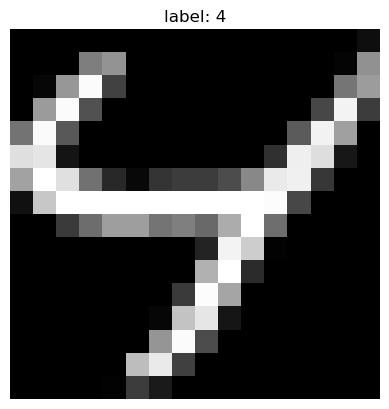

In [49]:
plt.imshow(np.reshape(y, (16,16)), cmap='gray')
plt.title(str(f'label: {Y_test[0, idx]}'))
plt.axis('off')
plt.show()

>Compute the distances d1 = ||y − y1⊥||2 and d2 = ||y − y2⊥||2 and classify y to C1 if d1 < d2 and to C2 if d2 < d1. We expect that it will be classified as C1 (i.e. 3):

In [50]:
d1 = np.linalg.norm(y-y1, 2)
d2 = np.linalg.norm(y-y2, 2)

print(f'Distance of our {Y_test[0, idx]} and its projection in the {C1} plane: {d1}')
print(f'Distance of our {Y_test[0, idx]} and its projection in the {C2} plane: {d2}')

if d1 < d2:
    print(f'The randomly sampled point is classified as it is digit {C1}')
else: 
    print(f'The randomly sampled point is classified as it is digit {C2}')

Distance of our 4 and its projection in the 3 plane: 4.193871276602964
Distance of our 4 and its projection in the 4 plane: 3.1817860181508517
The randomly sampled point is classified as it is digit 4


<div class="alert alert-block alert-success">
Since the test set is small we can forecast each point and count the misclassification number: 
</div>

In [51]:
def get_misclassified_points(X, Y, Us, classes):
    misclassified_points = 0

    for idx in range(Y.shape[-1]):
        y = X[:, idx]
        distances = []

        for u in Us:
            y_projected = u @ (u.T @ y)
            distances.append(np.linalg.norm(y-y_projected, 2))
        
        real_outcome = Y[0, idx]
        forecast = classes[np.argmin(distances)]

        if real_outcome != forecast:
            misclassified_points += 1
    
    return misclassified_points

In [52]:
print(f'Number of misclassified points: {get_misclassified_points(X_test, Y_test, [U1, U2], (C1, C2))}')

Number of misclassified points: 0


>Repeat the experiment for different digits other than 3 or 4.

<div class="alert alert-block alert-success">
In order to catch relationships between the visual similarity of the digits and the classification error we are required to select other pairs of digit based on our knowledge of similarity. <br>  
e.g. pairs of similar digits: [1,7] or [8,0] or [6,9] or [2,5]. The last two pairs are similar if the 'metric' is the symmetry.<br>
Let's run some experiments.
</div>

In [53]:
def run_experiment(classes):
    #Extract the digits from the pre-loaded dataset (precondition)
    X_dig, Y_dig = extract_digits(X, Y, classes)
    X_train, Y_train, X_test, Y_test = train_test_split(X_dig, Y_dig, Y_dig.shape[-1]//2)
    N = Y_test.shape[-1]

    #Split the classes for SVD and orthogonal projections purposes
    Xs = []
    Us = []
    for c in classes:
        idxs = (Y_train[0, :] == c)
        Xs.append(X_train[:, idxs])
        U_i, _, _ = np.linalg.svd(X_train[:, idxs], full_matrices=False)
        Us.append(U_i)

    #Compute misclassification
    misclassified_points = get_misclassified_points(X_test, Y_test, Us, classes)
    
    return misclassified_points, N

In [54]:
df = pd.DataFrame(columns=['Pair','#Misclassified Points', 'Total Points', 'Classification Error (%)', 'Accuracy'])

for classes in [(x,y) for x in range(10) for y in range(x+1, 10)]:
    misclassified_points, N = run_experiment(classes)
    df.loc[len(df)] = [classes, misclassified_points, N, misclassified_points/N, 1-misclassified_points/N]

print(df.to_string(index=False, justify='center'))

 Pair   #Misclassified Points  Total Points  Classification Error (%)  Accuracy
(0, 1)            2                286               0.006993          0.993007
(0, 2)           34                261               0.130268          0.869732
(0, 3)           64                225               0.284444          0.715556
(0, 4)           18                221               0.081448          0.918552
(0, 5)           36                204               0.176471          0.823529
(0, 6)           21                235               0.089362          0.910638
(0, 7)            4                243               0.016461          0.983539
(0, 8)           27                232               0.116379          0.883621
(0, 9)           10                226               0.044248          0.955752
(1, 2)            3                227               0.013216          0.986784
(1, 3)            2                192               0.010417          0.989583
(1, 4)            9                187  

<div class="alert alert-block alert-info">
<b>Observation:</b> There is no particular correlation between classification error and digits similarity, but we observe that the classification involving the digit zero is weaker. 
</div>

>The extension of this idea to the multiple classification task is trivial. Indeed, if we have more than 2 classes (say, k different classes) C1, . . . , Ck, we just need to repeat the same procedure as before for each matrix X1, . . , Xk to obtain the distances d1, . . , dk. Then, the new digit y will be classified as Ci if di is lower that dj for each j = 1,..,k.  
Repeat the exercise above with a 3-digit example.

In [55]:
df = pd.DataFrame(columns=['Pair','#Misclassified Points', 'Total Points', 'Classification Error (%)', 'Accuracy'])

for classes in [(x,y,z) for x in range(10) for y in range(x+1, 10) for z in range(y+1, 10)]:
    misclassified_points, N = run_experiment(classes)
    df.loc[len(df)] = [classes, misclassified_points, N, misclassified_points/N, 1-misclassified_points/N]

print(df.to_string(index=False, justify='center'))

   Pair    #Misclassified Points  Total Points  Classification Error (%)  Accuracy
(0, 1, 2)           29                387               0.074935          0.925065
(0, 1, 3)           54                351               0.153846          0.846154
(0, 1, 4)           27                347               0.077810          0.922190
(0, 1, 5)           53                330               0.160606          0.839394
(0, 1, 6)           48                361               0.132964          0.867036
(0, 1, 7)            8                369               0.021680          0.978320
(0, 1, 8)           48                358               0.134078          0.865922
(0, 1, 9)           15                352               0.042614          0.957386
(0, 2, 3)           99                326               0.303681          0.696319
(0, 2, 4)           55                322               0.170807          0.829193
(0, 2, 5)           48                305               0.157377          0.842623
(0, 

<div class="alert alert-block alert-info">
<b>Observation:</b> As before, the classification involving the digit zero is weaker. 
</div>

# Clustering with PCA

>Load the dataset in memory and explore its head and shape to understand how the informations are placed inside of it

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

data_url = '/Users/kor/University/Unibo/I year/I semester/statistical and mathematical methods for AI/Lab/data.csv'

In [6]:
ds = pd.read_csv(data_url)
print(f'Shape of the dataset: {ds.shape}')
ds.head()

Shape of the dataset: (42000, 785)


,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


<div class="alert alert-block alert-success">
There are 42000 data points of dimensionality 785 each.<br>
Pixels are stored by rows and not by columns , and the first column is the real classification of the digit.
</div>

>Split the dataset into the X matrix of dimension d × N, with d = 784 being the dimension of each datum, N is the number of datapoints, and Y ∈ RN containing the corresponding labels

In [7]:
data_array = np.array(ds)

X = data_array[:, 1:].T
Y = data_array[:, :1].T

print(f'X shape: {X.shape}')
print(f'Y shape: {Y.shape}')

X shape: (784, 42000)
Y shape: (1, 42000)


>Choose a number of digits and extract from X and Y the sub-dataset containing only the considered digits

In [59]:
digits = [3,6,7]
X, Y = extract_digits(X, Y, digits)
print(f'Shape of the new dataset: {X.shape}')

Shape of the new dataset: (784, 12889)


>Set Ntrain < N and randomly sample a training set with Ntrain datapoints from X (and the corresponding Y)

In [60]:
_, N = X.shape
N_train = round(N*0.66)

X_train, Y_train, X_test, Y_test = train_test_split(X, Y, N_train)

print(f'Shape of the train set: {X_train.shape}')
print(f'Shape of the test set: {X_test.shape}')

Shape of the train set: (784, 8507)
Shape of the test set: (784, 4382)


>Implement the algorithms computing the PCA of Xtrain with a fixed k. Visualize the results (for k = 2) and the position of the centroid of each cluster

In [8]:
def centroid(X):
    return np.mean(X, axis=1,keepdims=True)

Centroid of Xc is: 1.6419619039778551e-12
U_k shape: (2, 784)
Xc shape: (784, 8507)
Z_k shape: (2, 8507)


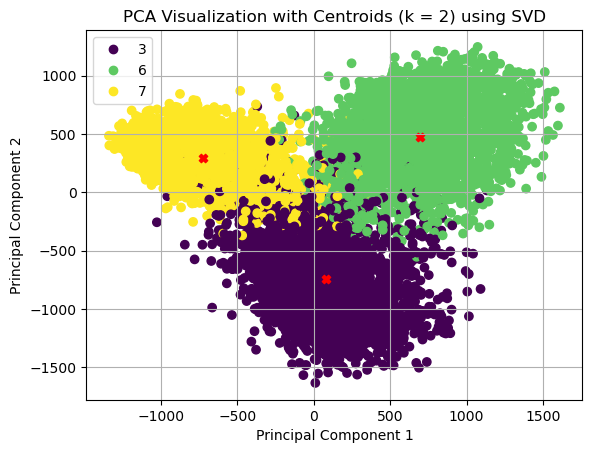

In [76]:
#Performing the training
k = 2

Xc = X_train - centroid(X_train)
print(f'Centroid of Xc is: {np.linalg.norm(centroid(Xc))}')

U, s, VT = np.linalg.svd(Xc)
U_k = U[:, :k].T
Z_k = U_k @ Xc

centroids = np.array([np.mean(Z_k[:, Y_train[0,:] == digit], axis=1) for digit in digits])

scatter = plt.scatter(Z_k[0, :], Z_k[1, :], c=Y_train[0, :], cmap='viridis')
plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', c='red', label='Centroids')
plt.title('PCA Visualization with Centroids (k = 2) using SVD')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(handles=scatter.legend_elements()[0], labels=digits)
plt.grid()
plt.show()

>Compute, for each cluster, the average distance from the centroid:

In [9]:
def average_distances_from_centroid(Z_k, Y, centroids, digits):
    avg_distances = []
    i = 0
    for digit in digits:
        cluster_points = Z_k[:, Y[0,:] == digit]
        centroid = centroids[i,:] #shape (k,)

        distances = np.linalg.norm(cluster_points - centroid[:, np.newaxis], axis=0, ord=2)
        
        avg_distance = np.mean(distances)
        avg_distances.append(avg_distance)

        i+=1

    return avg_distances


In [128]:
df = pd.DataFrame(columns=['Digit','AVG distance from its centroid'])

for i, distance in enumerate(average_distances_from_centroid(Z_k, Y_train, centroids, digits)):
    df.loc[len(df)] = [digits[i], distance]

print(df.to_string(index=False, justify='center'))

 Digit  AVG distance from its centroid
 3.0              415.238585          
 6.0              414.729244          
 7.0              303.448310          


>Compute, for each cluster, the average distance from the centroid on the test set:

In [141]:
df = pd.DataFrame(columns=['Digit','AVG distance from its centroid'])
X_test_c = X_test - centroid(X_test)

for i, distance in enumerate(average_distances_from_centroid(U_k @ X_test_c, Y_test, centroids, digits)):
    df.loc[len(df)] = [digits[i], distance]

print(df.to_string(index=False, justify='center'))

 Digit  AVG distance from its centroid
 3.0              425.125005          
 6.0              404.985957          
 7.0              307.172043          


<div class="alert alert-block alert-info">
<b>Observation:</b> The average distance is very similar to the one of the train set. 
</div>

>Define a classification algorithm in this way: given a new observation x, compute the distance between x and each cluster centroid. Assign x to the class corresponding to the closer centroid. Compute the results of this algorithm on the test set and compute its accuracy

In [10]:
def classify(U_k, X, Y, centroids, labels):
    labels = np.array(labels)
    Z_k = U_k @ X #shape (2,N_test)

    distances = np.array([np.linalg.norm(Z_k - centroid[:, np.newaxis], axis=0, ord=2) for centroid in centroids])
    predictions = labels[np.argmin(distances, axis=0)]

    return np.sum(predictions == Y[0,:]) / Y.shape[-1]

In [167]:
print(f'Accuracy on the test set: {classify(U_k, X_test_c, Y_test, centroids, digits)}')

Accuracy on the test set: 0.9541305340027385


>Repeat this experiment for different values of k and different digits. 

In [14]:
def run_PCA_experiment(k, digits):
    #Extract the digits from the dataset
    X_dig, Y_dig = extract_digits(X, Y, digits)
    _, N = X_dig.shape
    N_train = round(N*0.66)

    X_train, Y_train, X_test, Y_test = train_test_split(X_dig, Y_dig, N_train)

    #Training
    Xc = X_train - centroid(X_train)
    U, _, _ = np.linalg.svd(Xc, full_matrices=False)
    U_k = U[:, :k].T
    Z_k = U_k @ Xc

    centroids = np.array([np.mean(Z_k[:, Y_train[0,:] == digit], axis=1) for digit in digits])
    X_test_c = X_test - centroid(X_test)
    return classify(U_k, X_test_c, Y_test, centroids, digits)

<div class="alert alert-block alert-success">
We are going to pick a number of samples based on the concept of similarity that we get from the SVD classification
</div>

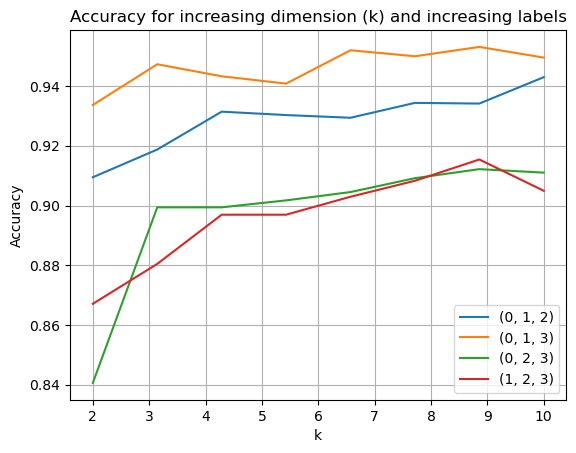

In [26]:
k_bot = 2
k_top = 10
domain = np.linspace(k_bot, k_top, k_top-k_bot)

top_range = 4
for digits in [(x,y,z) for x in range(0,top_range) for y in range(x+1,top_range) for z in range(y+1,top_range)]:
    accuracies = []
    for k in range(k_bot,k_top):
        accuracies.append(run_PCA_experiment(k, digits))

    plt.plot(domain, accuracies, label=digits)

plt.grid()
plt.title('Accuracy for increasing dimension (k) and increasing labels')
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.legend()
plt.show()